In [1]:
import tensorflow as tf
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers
from pathlib import Path
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import os
import time
from tensorflow.python.keras.backend import set_session
from tensorflow.python.keras.models import load_model
from tqdm.autonotebook import tqdm

/state/partition1/llgrid/pkg/anaconda/anaconda3-2020b/lib/python3.7/site-packages/ipykernel_launcher.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  del sys.path[0]


In [2]:
image_train=np.expand_dims(np.load('train_images.npy'), -1).astype(np.float32)
image_val=np.expand_dims(np.load('test_images.npy'), -1).astype(np.float32)

In [13]:
class imGAN:
    def __init__(self, imdims, noise_dim):
        self.dim_x = imdims
        self.noise_dim = noise_dim
    def discriminator(self):
        
        model = tf.keras.Sequential(name='discriminator')
        model.add(tf.keras.layers.InputLayer(input_shape=self.dim_x))
        
        model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=2))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU())
        model.add(tf.keras.layers.Dropout(0.1))
        
        model.add(tf.keras.layers.Conv2D(filters=128, kernel_size=3, strides=2))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU())
        model.add(tf.keras.layers.Dropout(0.1))
        
        model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=3, strides=2))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU())
        model.add(tf.keras.layers.Dropout(0.1))
        
        model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=3, strides=2))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU())
        model.add(tf.keras.layers.Dropout(0.1))
        
        model.add(tf.keras.layers.Flatten())
        
        model.add(tf.keras.layers.Dense(64))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU())
        model.add(tf.keras.layers.Dropout(0.1))
        
        
        model.add(tf.keras.layers.Dense(1))
        
        return model
    
    def generator(self):
    
        model = tf.keras.Sequential(name='generator')
        model.add(tf.keras.layers.InputLayer(input_shape=(self.noise_dim,)))

        #Dense layer. Maps our 50 dimensional layer to a 465 dimensional vector
        model.add(tf.keras.layers.Dense(30*65*16))
#         model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
        model.add(tf.keras.layers.Dropout(0.1))
        
        model.add(tf.keras.layers.Reshape(target_shape=(30, 65, 16))) #reshape our 465 dimensional vector into a 15x33 image

        #First Conv2DTranspose. We apply padding here since we want a 30x65 dimesional output
        model.add(tf.keras.layers.Conv2DTranspose(filters=128, kernel_size=3, strides=1, padding='same'))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
        model.add(tf.keras.layers.Dropout(0.1))
        
        model.add(tf.keras.layers.Conv2DTranspose(filters=128, kernel_size=3, strides=2, padding='same'))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
        model.add(tf.keras.layers.Dropout(0.1))
        
        model.add(tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=3, strides=2, padding='same'))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
        model.add(tf.keras.layers.Dropout(0.1))
        
        
        model.add(tf.keras.layers.Conv2D(filters=1, kernel_size=5, strides=1, padding='same',activation='sigmoid'))

        return model

In [14]:
@tf.function
def gradient_penalty(batch_size, real_images, fake_images, discriminator):
    
    # Get the interpolated image
    alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
    diff = fake_images - real_images
    interpolated = real_images + alpha * diff

    with tf.GradientTape() as gp_tape:
        gp_tape.watch(interpolated)
        # 1. Get the discriminator output for this interpolated image.
        pred = discriminator(interpolated, training=True)

    # 2. Calculate the gradients w.r.t to this interpolated image.
    grads = gp_tape.gradient(pred, [interpolated])[0]
    # 3. Calculate the norm of the gradients.
    norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
    gp = tf.reduce_mean((norm - 1.0) ** 2)
    
    return gp

In [15]:
def get_train_step():
    @tf.function
    def train_step(X_real, generator, discriminator, g_optimizer, d_optimizer, noise_dim, d_extra = 3, gp_w = 10.0):
        
        binary_cross_entropy_loss_fn = keras.losses.BinaryCrossentropy(from_logits=True)
        batch_size = X_real.shape[0]
        
        batch_size = tf.shape(X_real)[0]

        for i in range(d_extra):
            z = tf.random.normal(shape=(batch_size, noise_dim))
            X_fake = generator(z, training=False)
            with tf.GradientTape() as tape:
                d_real = discriminator(X_real)
    #             d_loss_real = binary_cross_entropy_loss_fn(tf.ones_like(d_real),d_real)
                d_loss_real = -tf.reduce_mean(d_real)
                d_fake = discriminator(X_fake)
    #             d_loss_fake = binary_cross_entropy_loss_fn(tf.zeros_like(d_fake),d_fake)
                d_loss_fake = tf.reduce_mean(d_fake)
            
                gp = gradient_penalty(batch_size, X_real, X_fake,discriminator)
                d_loss = (d_loss_fake + d_loss_real)  + gp_w * gp
                
            variables = discriminator.trainable_weights
            gradients = tape.gradient(d_loss, variables)
            d_optimizer.apply_gradients(zip(gradients, variables))
            

        z = tf.random.normal(shape=(batch_size, noise_dim))

        with tf.GradientTape() as tape:
            x_fake_train = generator(z)
            d_fake = discriminator(x_fake_train)
#             g_loss = binary_cross_entropy_loss_fn(tf.ones_like(d_fake),d_fake)
            g_loss = -tf.reduce_mean(d_fake)


        variables = generator.trainable_weights
        gradients = tape.gradient(g_loss, variables)
        g_optimizer.apply_gradients(zip(gradients, variables))

        
        return d_loss_real, d_loss_fake, g_loss
    return train_step

In [16]:
def traindataGAN(dataset, generator, discriminator, generator_optimizer, discriminator_optimizer, noise_dim, epochs=200):
    train_step=get_train_step()
    GLcurve=[]
    DLcurve=[]
    for epoch in range(epochs):
        noise = tf.random.normal([BATCH_SIZE, noise_dim])
        generated_images = generator(noise, training=False)
        plt.imshow(np.squeeze(generated_images[0]), cmap="gray")
        plt.show()
        
        DLRtot=0
        DLFtot = 0
        GLtot=0
        numbatches=0
        r = tqdm(dataset)
        for batch in r:
            numbatches+=1
            DLR, DLF, GL = train_step(batch, generator, discriminator, generator_optimizer, discriminator_optimizer, noise_dim)
            DLRtot+=DLR
            DLFtot+=DLF
            GLtot+=GL
            r.set_postfix_str("GL:" + str(GL.numpy()) + ", DLR: " + str(DLR.numpy()) + ", DLF: " + str(DLF.numpy()))
        GLtot=GLtot/numbatches
        DLtot=(DLRtot+DLFtot)/2/numbatches
        GLcurve.append(GLtot)
        DLcurve.append(DLtot)
        # Save the model every 15 epochs
        if (epoch + 1) % 15 == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)
        print("Epoch " + str(epoch) +  ", Gen Loss: " + str(float(GLtot)) + ", Disc Loss: " + str(float(DLtot)))
#     plotGANTraining(GLcurve,DLcurve)


Model: "generator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 31200)             1029600   
_________________________________________________________________
leaky_re_lu_17 (LeakyReLU)   (None, 31200)             0         
_________________________________________________________________
dropout_17 (Dropout)         (None, 31200)             0         
_________________________________________________________________
reshape_2 (Reshape)          (None, 30, 65, 16)        0         
_________________________________________________________________
conv2d_transpose_6 (Conv2DTr (None, 30, 65, 128)       18560     
_________________________________________________________________
batch_normalization_15 (Batc (None, 30, 65, 128)       512       
_________________________________________________________________
leaky_re_lu_18 (LeakyReLU)   (None, 30, 65, 128)       0 

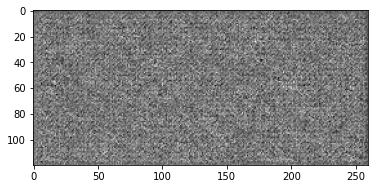


Epoch 0, Gen Loss: -11.308897018432617, Disc Loss: -12.403557777404785


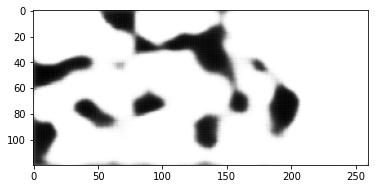


Epoch 1, Gen Loss: 11.898539543151855, Disc Loss: -1.667511224746704


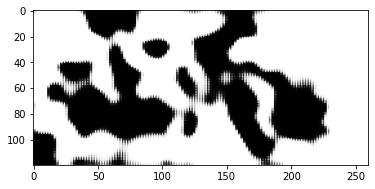


Epoch 2, Gen Loss: -15.531826972961426, Disc Loss: -6.5489630699157715


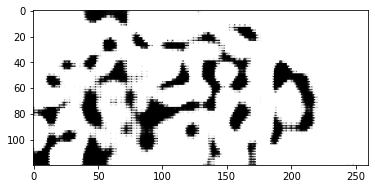


Epoch 3, Gen Loss: -24.692853927612305, Disc Loss: -11.531301498413086


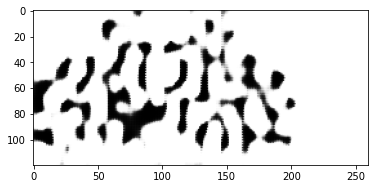


Epoch 4, Gen Loss: -17.328998565673828, Disc Loss: -14.840117454528809


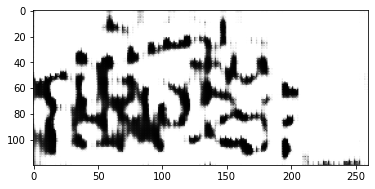


Epoch 5, Gen Loss: 0.12421160191297531, Disc Loss: -1.1011260747909546


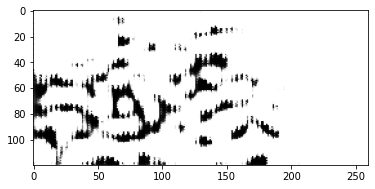


Epoch 6, Gen Loss: -3.997803211212158, Disc Loss: -5.617978096008301


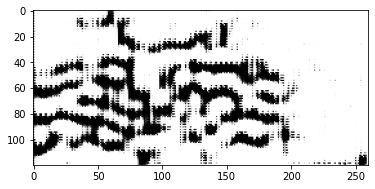


Epoch 7, Gen Loss: 7.931553840637207, Disc Loss: -1.003403663635254


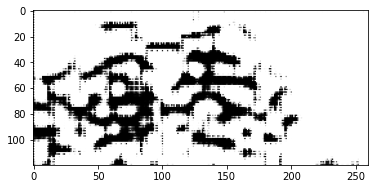


Epoch 8, Gen Loss: 11.991175651550293, Disc Loss: -2.454211950302124


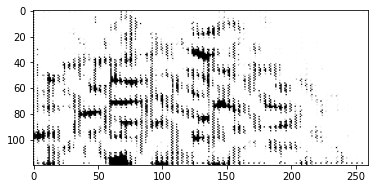


Epoch 9, Gen Loss: 11.850794792175293, Disc Loss: -1.8075309991836548


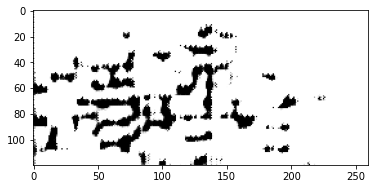


Epoch 10, Gen Loss: 9.86520767211914, Disc Loss: 0.24372723698616028


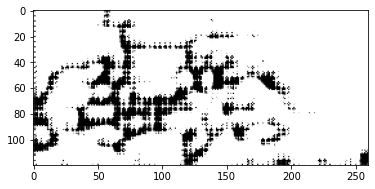


Epoch 11, Gen Loss: 12.191614151000977, Disc Loss: -0.9922429323196411


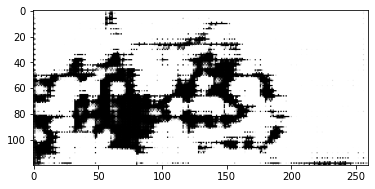


Epoch 12, Gen Loss: 24.87693214416504, Disc Loss: -2.590912103652954


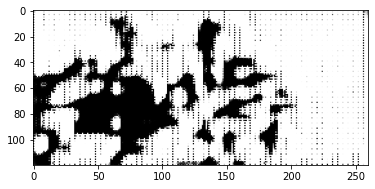


Epoch 13, Gen Loss: 18.734384536743164, Disc Loss: -3.4014170169830322


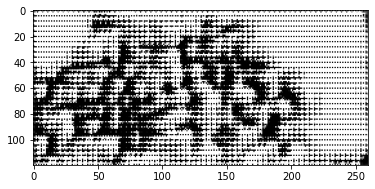


Epoch 14, Gen Loss: 12.951040267944336, Disc Loss: -5.777093410491943


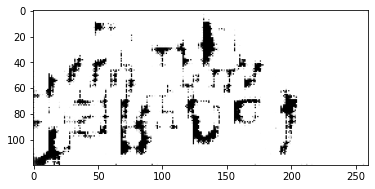


Epoch 15, Gen Loss: 12.15427303314209, Disc Loss: 0.9583895802497864


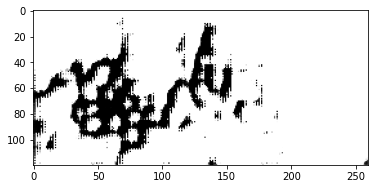


Epoch 16, Gen Loss: 23.807796478271484, Disc Loss: -0.3829077184200287


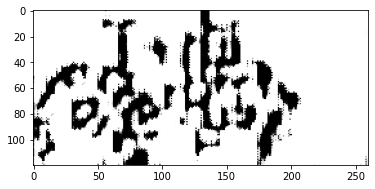


Epoch 17, Gen Loss: 23.512916564941406, Disc Loss: 0.6997979283332825


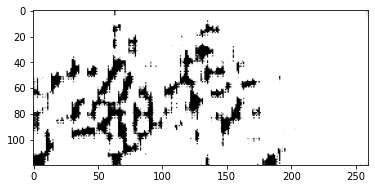


Epoch 18, Gen Loss: 16.41799545288086, Disc Loss: -0.23805183172225952


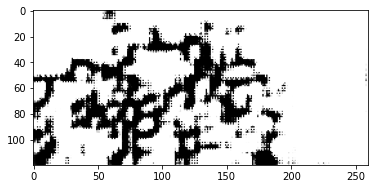


Epoch 19, Gen Loss: 30.631423950195312, Disc Loss: -0.66650390625


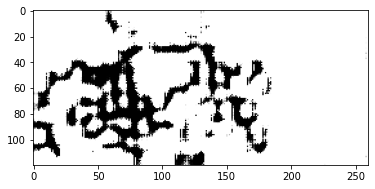


Epoch 20, Gen Loss: 24.22109031677246, Disc Loss: -0.6718862652778625


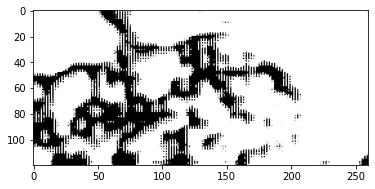


Epoch 21, Gen Loss: 25.983957290649414, Disc Loss: -0.9156589508056641


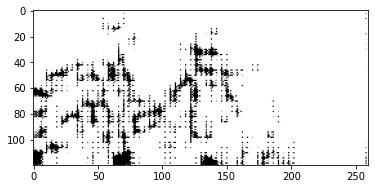


Epoch 22, Gen Loss: 14.140755653381348, Disc Loss: 0.4497031271457672


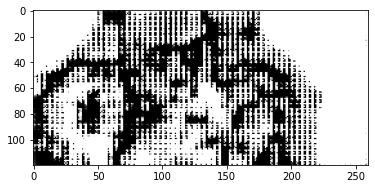


Epoch 23, Gen Loss: 28.539474487304688, Disc Loss: -1.1562776565551758


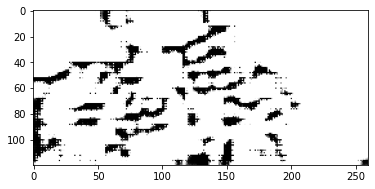


Epoch 24, Gen Loss: 25.39322280883789, Disc Loss: -1.0400502681732178


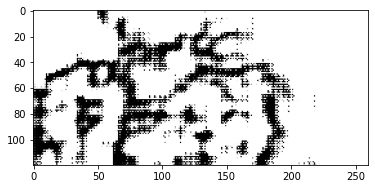


Epoch 25, Gen Loss: 30.963586807250977, Disc Loss: -0.6514779925346375


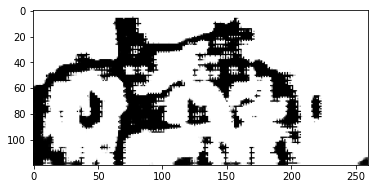


Epoch 26, Gen Loss: 26.177417755126953, Disc Loss: -2.638366222381592


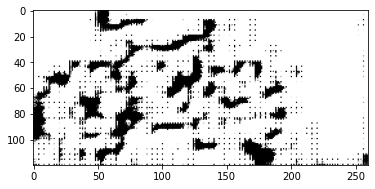


Epoch 27, Gen Loss: 32.75049591064453, Disc Loss: -3.0846493244171143


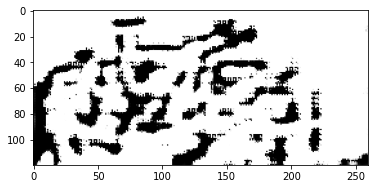


Epoch 28, Gen Loss: 28.664997100830078, Disc Loss: -1.090731143951416


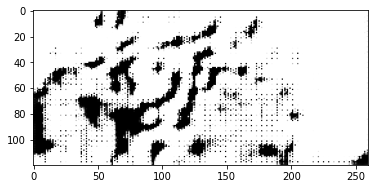


Epoch 29, Gen Loss: 12.789763450622559, Disc Loss: -4.459033012390137


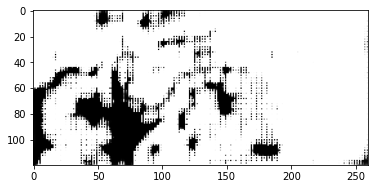


Epoch 30, Gen Loss: 2.2635385990142822, Disc Loss: -2.527292013168335


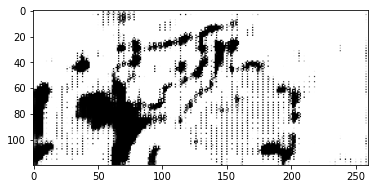


Epoch 31, Gen Loss: 18.469453811645508, Disc Loss: -1.5718976259231567


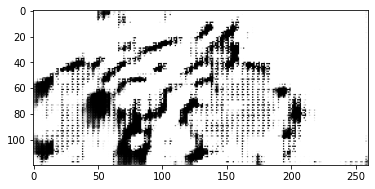


Epoch 32, Gen Loss: 14.94742488861084, Disc Loss: -1.296335220336914


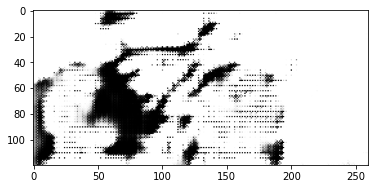


Epoch 33, Gen Loss: 10.609610557556152, Disc Loss: -0.493391752243042


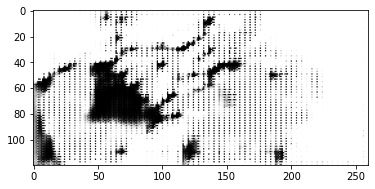


Epoch 34, Gen Loss: 15.542558670043945, Disc Loss: 0.507673978805542


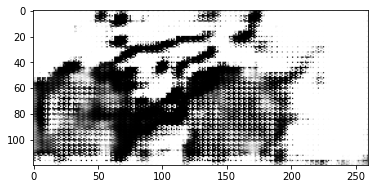


Epoch 35, Gen Loss: 5.682669162750244, Disc Loss: -1.3066754341125488


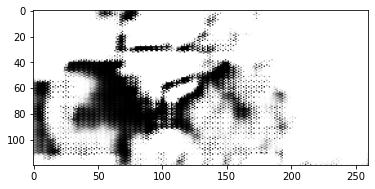


Epoch 36, Gen Loss: 10.878610610961914, Disc Loss: 0.0006380554405041039


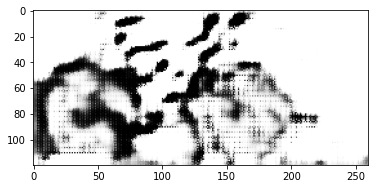


Epoch 37, Gen Loss: 14.955668449401855, Disc Loss: 0.0879373773932457


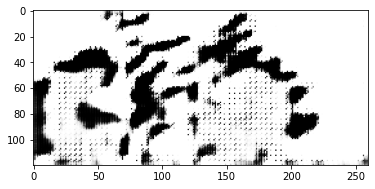


Epoch 38, Gen Loss: 17.297605514526367, Disc Loss: -0.2723648250102997


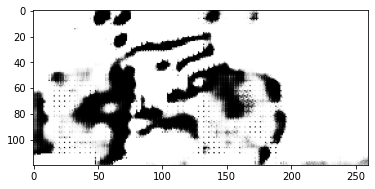


Epoch 39, Gen Loss: 20.412418365478516, Disc Loss: -0.15635216236114502


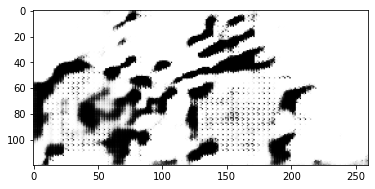


Epoch 40, Gen Loss: 20.973745346069336, Disc Loss: -0.35107681155204773


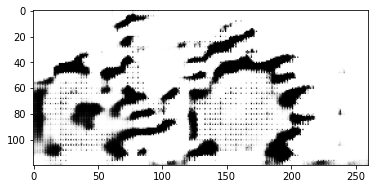


Epoch 41, Gen Loss: 23.690216064453125, Disc Loss: -0.37208157777786255


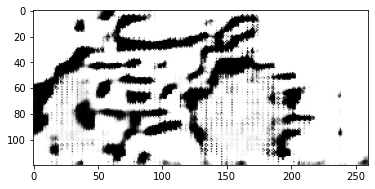


Epoch 42, Gen Loss: 22.563953399658203, Disc Loss: -0.28412947058677673


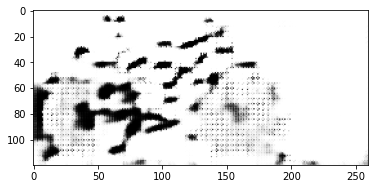


Epoch 43, Gen Loss: 22.71292495727539, Disc Loss: -0.4876440465450287


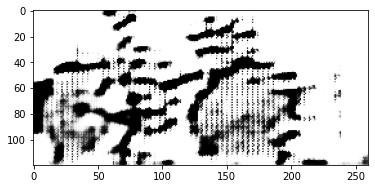


Epoch 44, Gen Loss: 21.88384437561035, Disc Loss: -0.48201844096183777


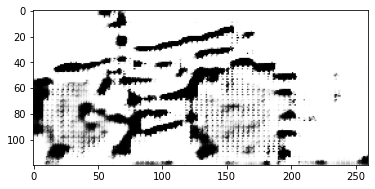


Epoch 45, Gen Loss: 23.927505493164062, Disc Loss: -0.40631839632987976


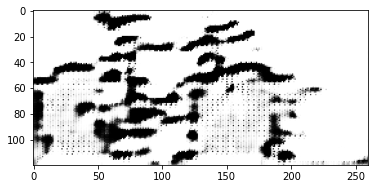


Epoch 46, Gen Loss: 23.41844367980957, Disc Loss: -0.3002176582813263


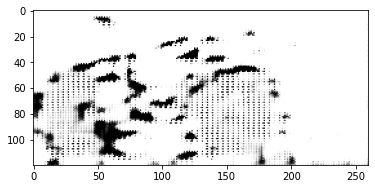


Epoch 47, Gen Loss: 22.273475646972656, Disc Loss: -0.424174427986145


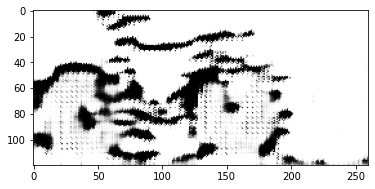


Epoch 48, Gen Loss: 19.098491668701172, Disc Loss: -0.5037209987640381


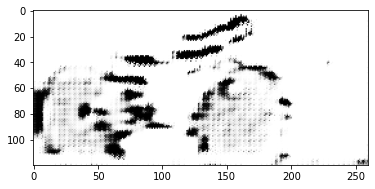


Epoch 49, Gen Loss: 21.349788665771484, Disc Loss: -0.284578800201416


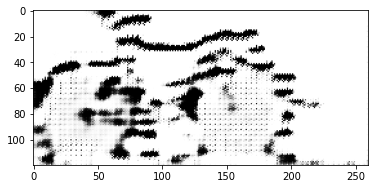


Epoch 50, Gen Loss: 22.328392028808594, Disc Loss: -0.5542711019515991


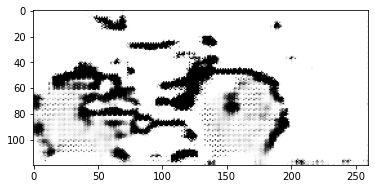


Epoch 51, Gen Loss: 23.132476806640625, Disc Loss: -0.3670758306980133


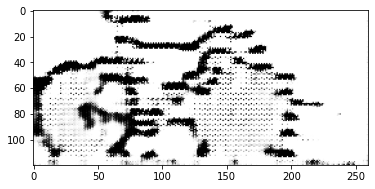


Epoch 52, Gen Loss: 24.721403121948242, Disc Loss: -0.4498187005519867


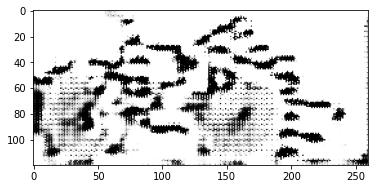


Epoch 53, Gen Loss: 23.223716735839844, Disc Loss: -0.48221755027770996


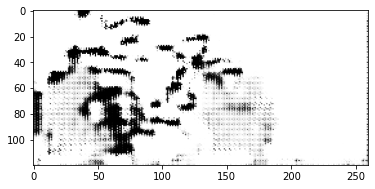


Epoch 54, Gen Loss: 22.9425106048584, Disc Loss: -0.417411208152771


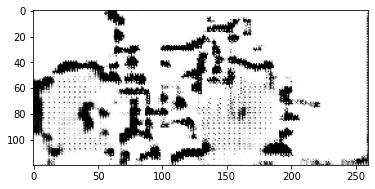


Epoch 55, Gen Loss: 22.41337013244629, Disc Loss: -0.3452434241771698


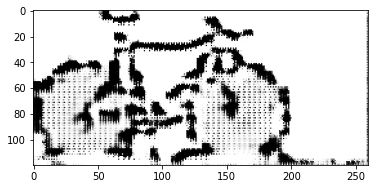


Epoch 56, Gen Loss: 23.235366821289062, Disc Loss: -0.48027828335762024


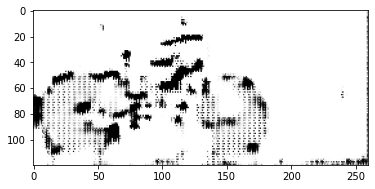


Epoch 57, Gen Loss: 21.77821922302246, Disc Loss: -0.6670588254928589


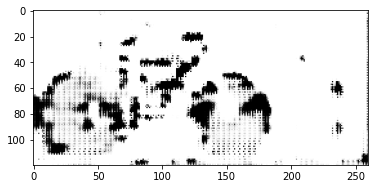


Epoch 58, Gen Loss: 17.950313568115234, Disc Loss: -0.543225884437561


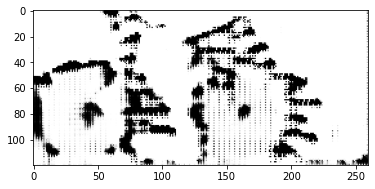


Epoch 59, Gen Loss: 16.216121673583984, Disc Loss: -0.6713888645172119


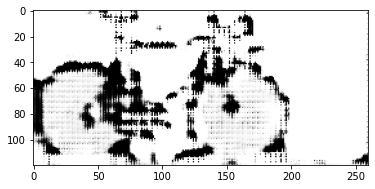


Epoch 60, Gen Loss: 17.808378219604492, Disc Loss: -0.21244476735591888


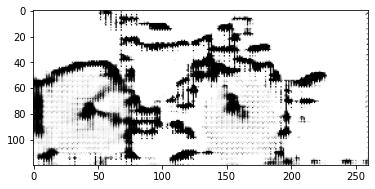


Epoch 61, Gen Loss: 18.090261459350586, Disc Loss: -0.3108949065208435


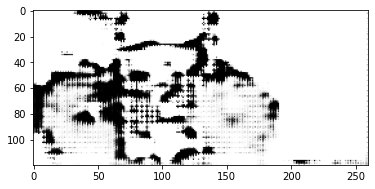


Epoch 62, Gen Loss: 17.597320556640625, Disc Loss: -0.44480517506599426


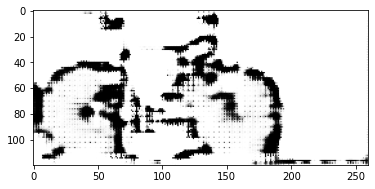


Epoch 63, Gen Loss: 15.739574432373047, Disc Loss: -0.5200878977775574


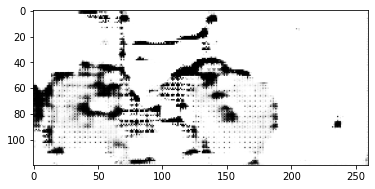


Epoch 64, Gen Loss: 15.31339168548584, Disc Loss: -0.530380368232727


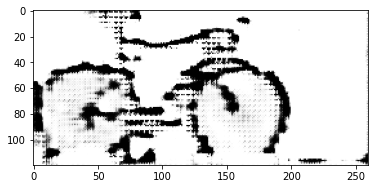


Epoch 65, Gen Loss: 14.923832893371582, Disc Loss: -0.48724105954170227


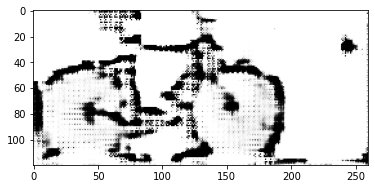


Epoch 66, Gen Loss: 16.10459327697754, Disc Loss: -0.42137807607650757


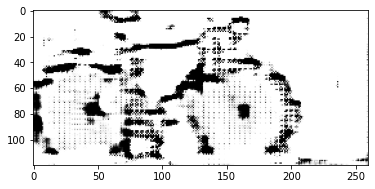


Epoch 67, Gen Loss: 16.180540084838867, Disc Loss: -0.62215256690979


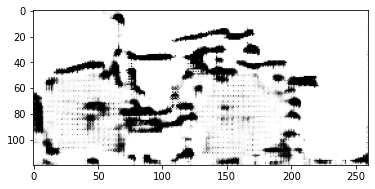


Epoch 68, Gen Loss: 15.577719688415527, Disc Loss: -0.4634217619895935


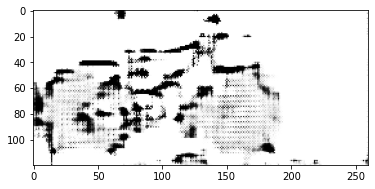


Epoch 69, Gen Loss: 17.432483673095703, Disc Loss: -0.37365031242370605


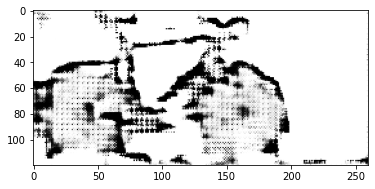


Epoch 70, Gen Loss: 17.113872528076172, Disc Loss: -0.5510738492012024


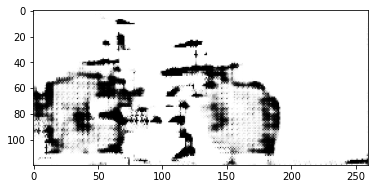


Epoch 71, Gen Loss: 16.299646377563477, Disc Loss: -0.5156310796737671


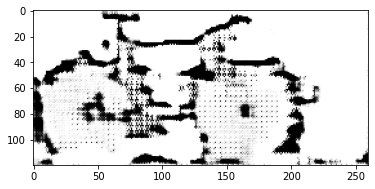


Epoch 72, Gen Loss: 15.493245124816895, Disc Loss: -0.4762880504131317


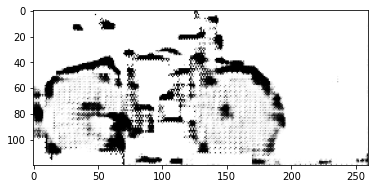


Epoch 73, Gen Loss: 15.245075225830078, Disc Loss: -0.47309690713882446


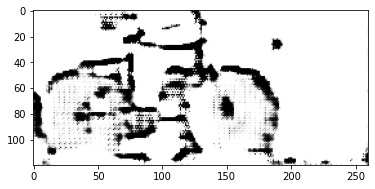


Epoch 74, Gen Loss: 15.608901023864746, Disc Loss: -0.4250531494617462


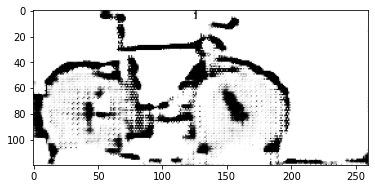


Epoch 75, Gen Loss: 15.328125, Disc Loss: -0.4547361433506012


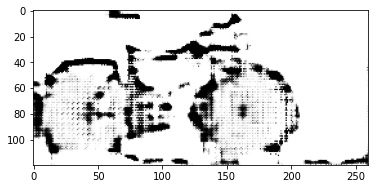


Epoch 76, Gen Loss: 15.571834564208984, Disc Loss: -0.495466947555542


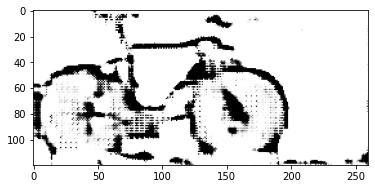


Epoch 77, Gen Loss: 15.70341968536377, Disc Loss: -0.403567910194397


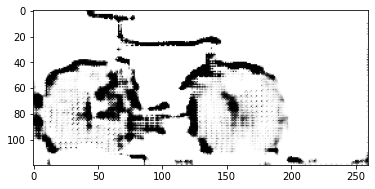


Epoch 78, Gen Loss: 15.700020790100098, Disc Loss: -0.5012484192848206


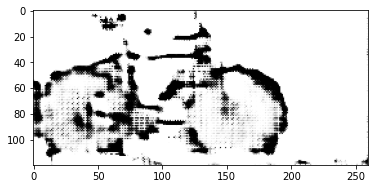


Epoch 79, Gen Loss: 15.584050178527832, Disc Loss: -0.4974633753299713


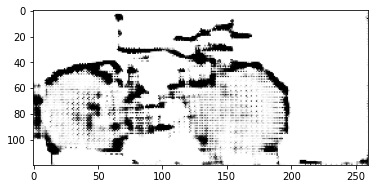


Epoch 80, Gen Loss: 15.59897232055664, Disc Loss: -0.4402669370174408


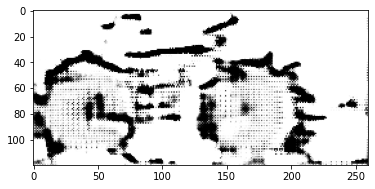


Epoch 81, Gen Loss: 16.205989837646484, Disc Loss: -0.4549500048160553


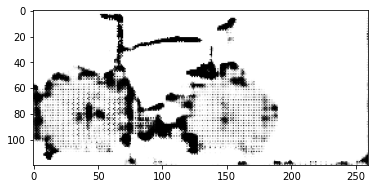


Epoch 82, Gen Loss: 16.90013885498047, Disc Loss: -0.4404340088367462


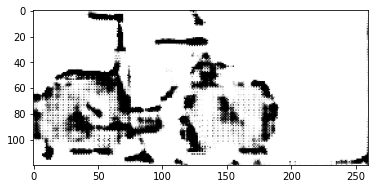


Epoch 83, Gen Loss: 15.673870086669922, Disc Loss: -0.45621052384376526


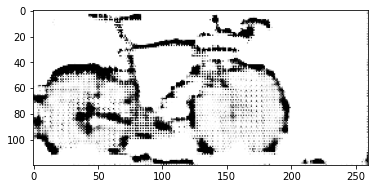


Epoch 84, Gen Loss: 15.580677032470703, Disc Loss: -0.4365048110485077


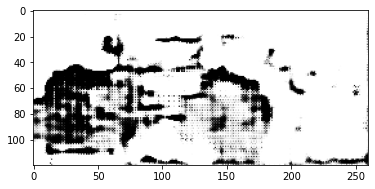


Epoch 85, Gen Loss: 16.12525749206543, Disc Loss: -0.4350135624408722


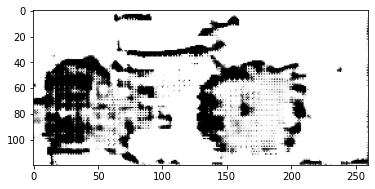


Epoch 86, Gen Loss: 15.042007446289062, Disc Loss: -0.4952106773853302


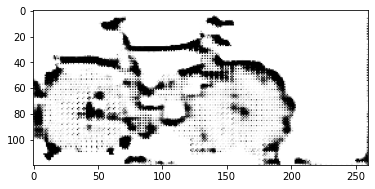


Epoch 87, Gen Loss: 15.170289039611816, Disc Loss: -0.49323463439941406


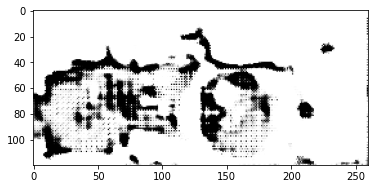


Epoch 88, Gen Loss: 14.472504615783691, Disc Loss: -0.5278761982917786


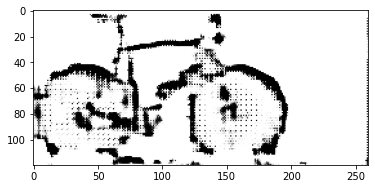


Epoch 89, Gen Loss: 14.438530921936035, Disc Loss: -0.6074409484863281


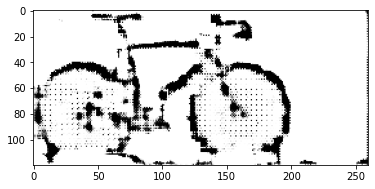


Epoch 90, Gen Loss: 14.185989379882812, Disc Loss: -0.5578362345695496


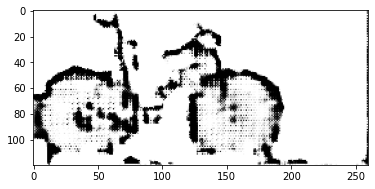


Epoch 91, Gen Loss: 15.487504005432129, Disc Loss: -0.46864092350006104


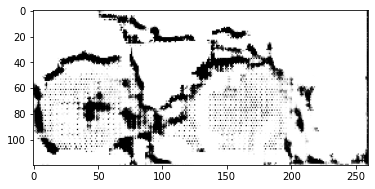


Epoch 92, Gen Loss: 14.901330947875977, Disc Loss: -0.4804258942604065


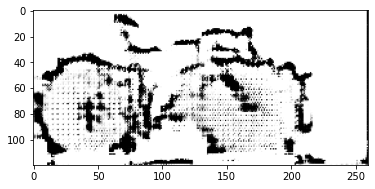


Epoch 93, Gen Loss: 14.15835952758789, Disc Loss: -0.48858165740966797


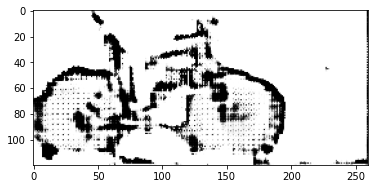


Epoch 94, Gen Loss: 15.124134063720703, Disc Loss: -0.40123820304870605


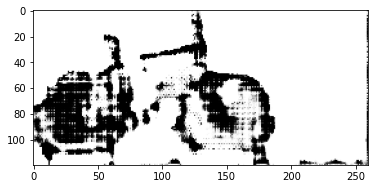


Epoch 95, Gen Loss: 13.955925941467285, Disc Loss: -0.49914291501045227


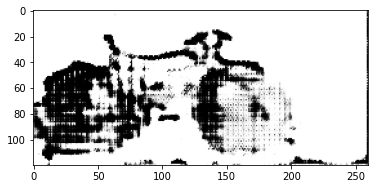


Epoch 96, Gen Loss: 14.734761238098145, Disc Loss: -0.46249669790267944


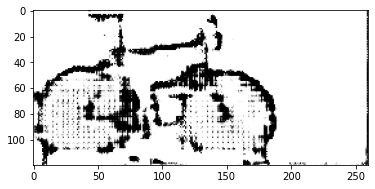


Epoch 97, Gen Loss: 14.517800331115723, Disc Loss: -0.4744868576526642


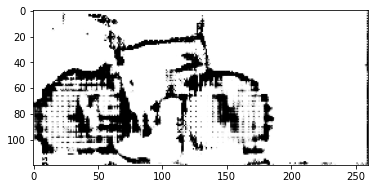


Epoch 98, Gen Loss: 14.523401260375977, Disc Loss: -0.4577130377292633


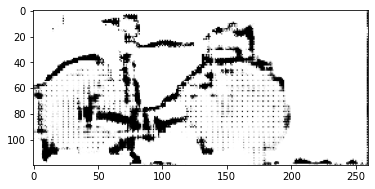


Epoch 99, Gen Loss: 14.686687469482422, Disc Loss: -0.45287609100341797


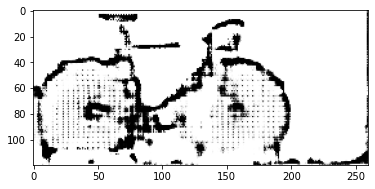


Epoch 100, Gen Loss: 13.248746871948242, Disc Loss: -0.38494613766670227


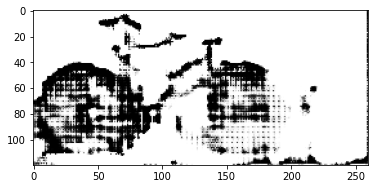


Epoch 101, Gen Loss: 13.726850509643555, Disc Loss: -0.40913641452789307


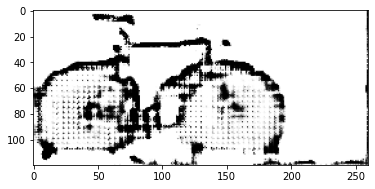


Epoch 102, Gen Loss: 13.786550521850586, Disc Loss: -0.48951277136802673


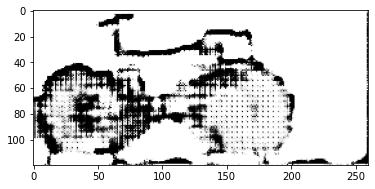


Epoch 103, Gen Loss: 13.665704727172852, Disc Loss: -0.5219964385032654


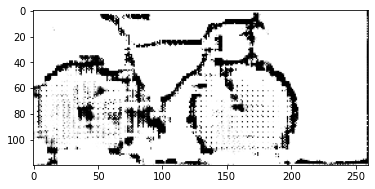


Epoch 104, Gen Loss: 13.84348201751709, Disc Loss: -0.5527997612953186


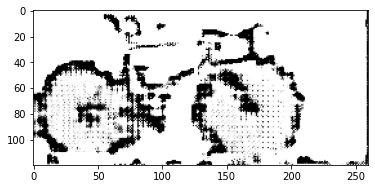


Epoch 105, Gen Loss: 14.520055770874023, Disc Loss: -0.42382943630218506


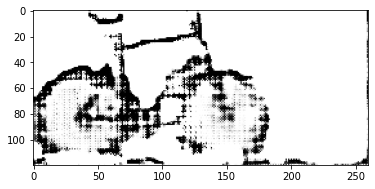


Epoch 106, Gen Loss: 14.44533634185791, Disc Loss: -0.3945212960243225


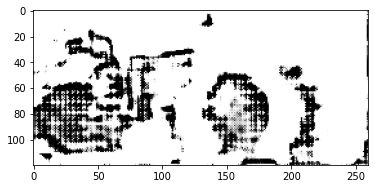


Epoch 107, Gen Loss: 14.238505363464355, Disc Loss: -0.4191180169582367


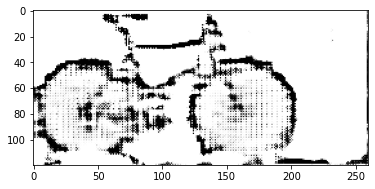


Epoch 108, Gen Loss: 14.377324104309082, Disc Loss: -0.4636736810207367


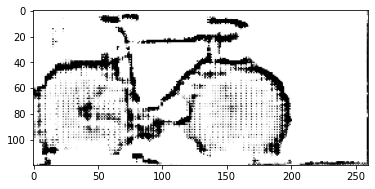


Epoch 109, Gen Loss: 14.87961483001709, Disc Loss: -0.39463427662849426


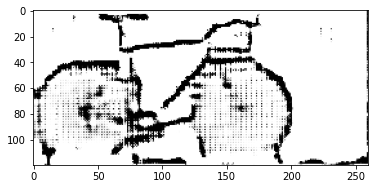


Epoch 110, Gen Loss: 14.621356964111328, Disc Loss: -0.36582913994789124


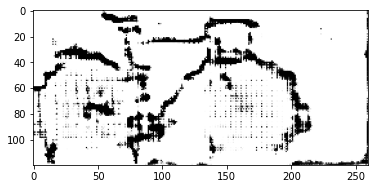


Epoch 111, Gen Loss: 14.5180025100708, Disc Loss: -0.3729148507118225


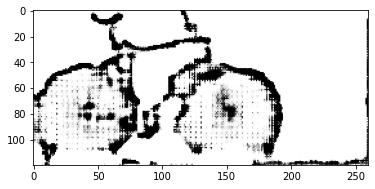


Epoch 112, Gen Loss: 15.064316749572754, Disc Loss: -0.32214832305908203


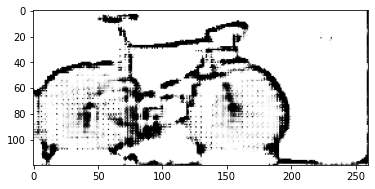


Epoch 113, Gen Loss: 15.219584465026855, Disc Loss: -0.41279980540275574


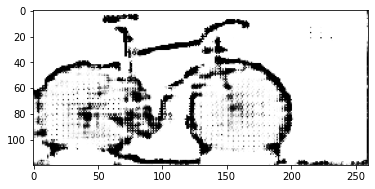


Epoch 114, Gen Loss: 14.606334686279297, Disc Loss: -0.39081114530563354


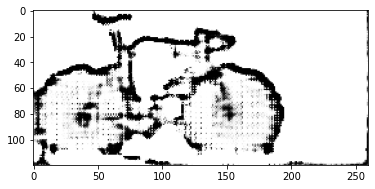


Epoch 115, Gen Loss: 14.672210693359375, Disc Loss: -0.3391416370868683


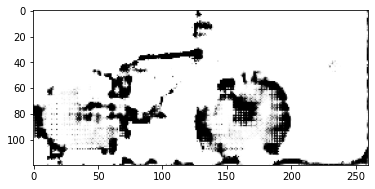


Epoch 116, Gen Loss: 15.2434720993042, Disc Loss: -0.45381325483322144


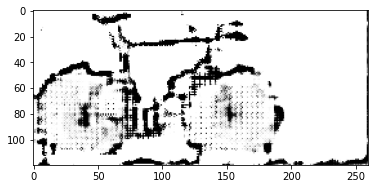


Epoch 117, Gen Loss: 14.203699111938477, Disc Loss: -0.49670541286468506


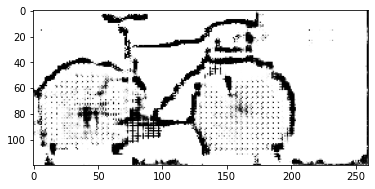


Epoch 118, Gen Loss: 14.822670936584473, Disc Loss: -0.5504098534584045


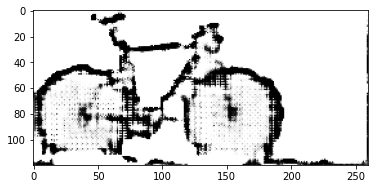


Epoch 119, Gen Loss: 14.161665916442871, Disc Loss: -0.44877418875694275


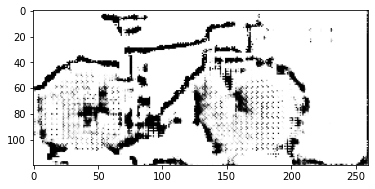


Epoch 120, Gen Loss: 13.94827651977539, Disc Loss: -0.41488322615623474


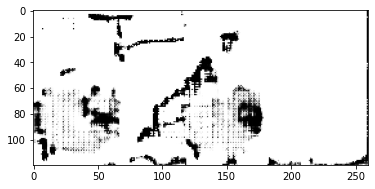


Epoch 121, Gen Loss: 13.279559135437012, Disc Loss: -0.4929303228855133


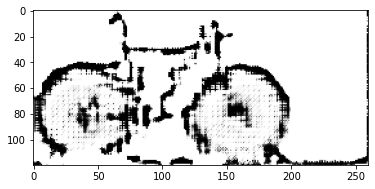


Epoch 122, Gen Loss: 13.297513008117676, Disc Loss: -0.609848141670227


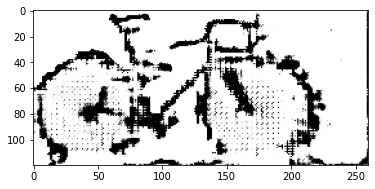


Epoch 123, Gen Loss: 13.19863224029541, Disc Loss: -0.4914321303367615


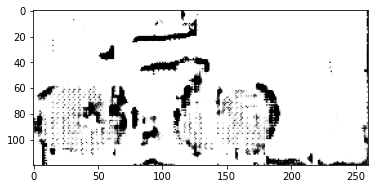


Epoch 124, Gen Loss: 12.91369915008545, Disc Loss: -0.428352952003479


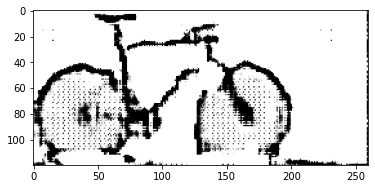


Epoch 125, Gen Loss: 13.287212371826172, Disc Loss: -0.6350162625312805


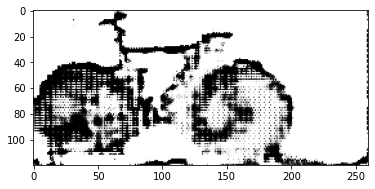


Epoch 126, Gen Loss: 12.872798919677734, Disc Loss: -0.515717625617981


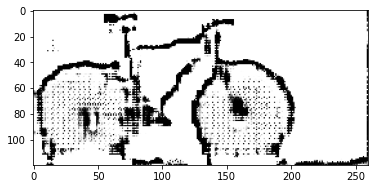


Epoch 127, Gen Loss: 12.691774368286133, Disc Loss: -0.5518370270729065


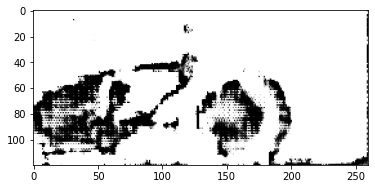


Epoch 128, Gen Loss: 12.419118881225586, Disc Loss: -0.543958306312561


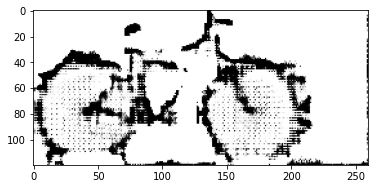


Epoch 129, Gen Loss: 12.275983810424805, Disc Loss: -0.5712453126907349


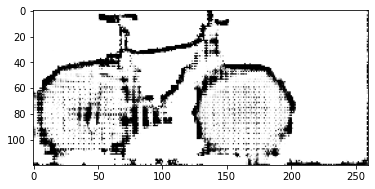


Epoch 130, Gen Loss: 12.189704895019531, Disc Loss: -0.703923225402832


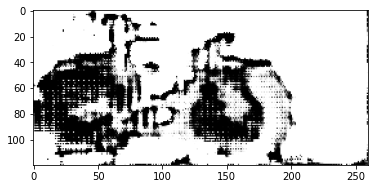


Epoch 131, Gen Loss: 11.877836227416992, Disc Loss: -0.7229328751564026


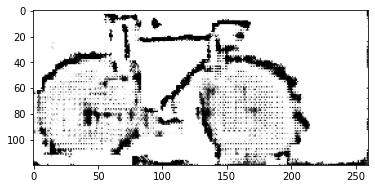


Epoch 132, Gen Loss: 11.881050109863281, Disc Loss: -0.4900062382221222


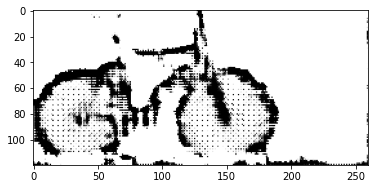


Epoch 133, Gen Loss: 10.965168952941895, Disc Loss: -0.8949835896492004


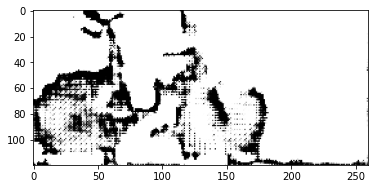


Epoch 134, Gen Loss: 10.998993873596191, Disc Loss: -0.4846009612083435


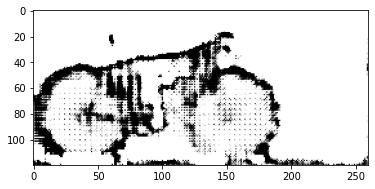


Epoch 135, Gen Loss: 11.707951545715332, Disc Loss: -0.5491194725036621


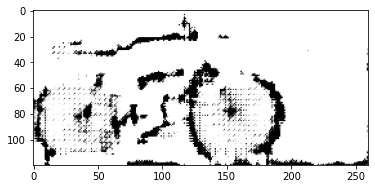


Epoch 136, Gen Loss: 11.78959846496582, Disc Loss: -0.6843551993370056


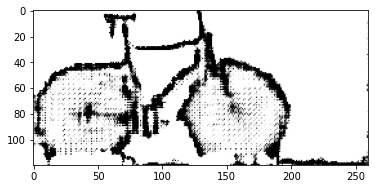


Epoch 137, Gen Loss: 11.293778419494629, Disc Loss: -0.659713864326477


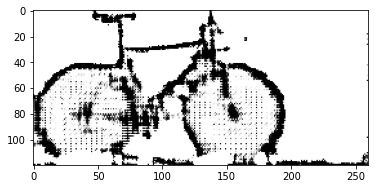


Epoch 138, Gen Loss: 10.98792552947998, Disc Loss: -0.6463397741317749


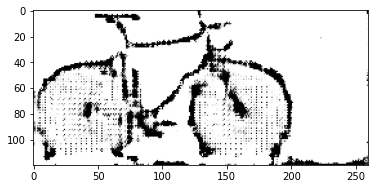


Epoch 139, Gen Loss: 11.361715316772461, Disc Loss: -0.7073684334754944


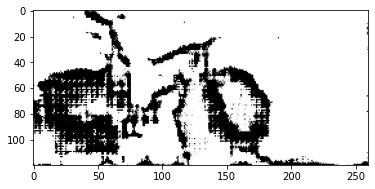


Epoch 140, Gen Loss: 10.243183135986328, Disc Loss: -0.7494363784790039


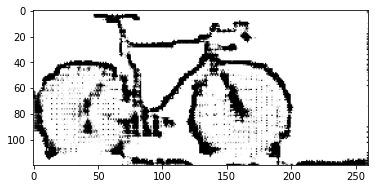


Epoch 141, Gen Loss: 10.38969612121582, Disc Loss: -0.6473817229270935


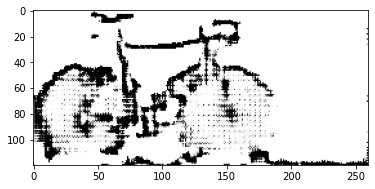


Epoch 142, Gen Loss: 9.843440055847168, Disc Loss: -0.6053003668785095


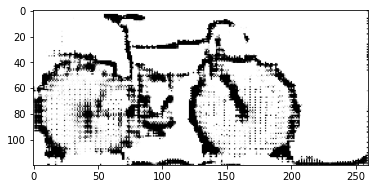


Epoch 143, Gen Loss: 10.680490493774414, Disc Loss: -0.7144628167152405


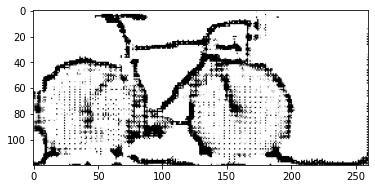


Epoch 144, Gen Loss: 10.00302505493164, Disc Loss: -0.71820068359375


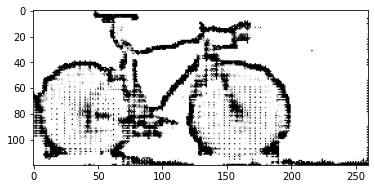


Epoch 145, Gen Loss: 9.13835334777832, Disc Loss: -0.708625078201294


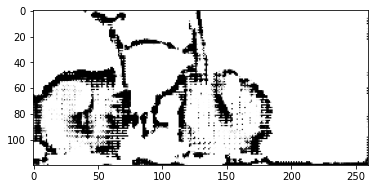


Epoch 146, Gen Loss: 9.109336853027344, Disc Loss: -0.7216792702674866


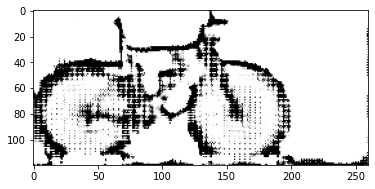


Epoch 147, Gen Loss: 8.914861679077148, Disc Loss: -0.5986366868019104


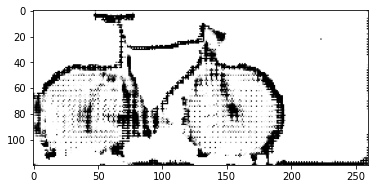


Epoch 148, Gen Loss: 9.428772926330566, Disc Loss: -0.730229377746582


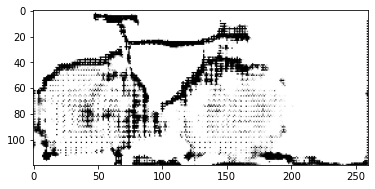


Epoch 149, Gen Loss: 9.719812393188477, Disc Loss: -0.7096613645553589


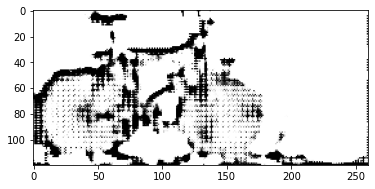


Epoch 150, Gen Loss: 8.704179763793945, Disc Loss: -0.6467888951301575


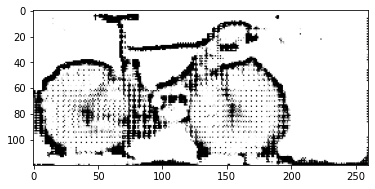


Epoch 151, Gen Loss: 9.694306373596191, Disc Loss: -0.7095003724098206


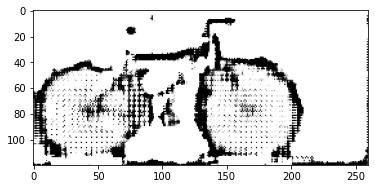


Epoch 152, Gen Loss: 8.987325668334961, Disc Loss: -0.8028807044029236


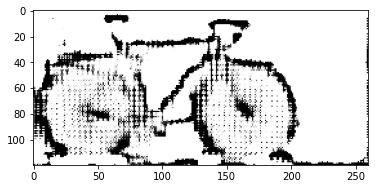


Epoch 153, Gen Loss: 8.95109748840332, Disc Loss: -0.658903956413269


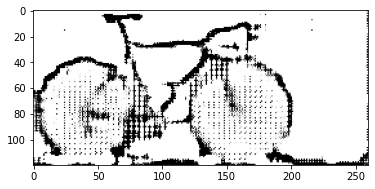


Epoch 154, Gen Loss: 8.729863166809082, Disc Loss: -0.8360740542411804


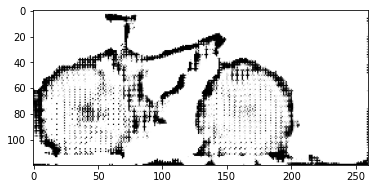


Epoch 155, Gen Loss: 8.314752578735352, Disc Loss: -0.8029412627220154


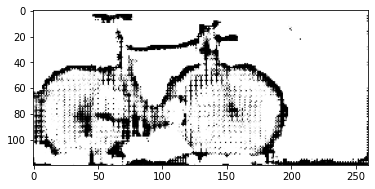


Epoch 156, Gen Loss: 8.346802711486816, Disc Loss: -1.057274341583252


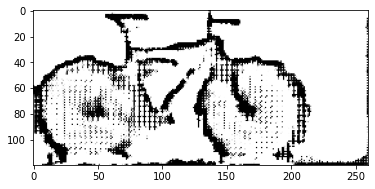


Epoch 157, Gen Loss: 8.478322982788086, Disc Loss: -0.7200395464897156


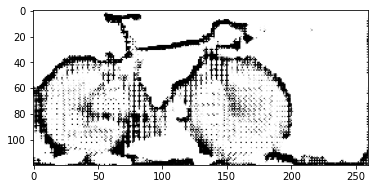


Epoch 158, Gen Loss: 8.581119537353516, Disc Loss: -0.8812344670295715


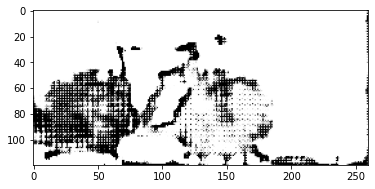


Epoch 159, Gen Loss: 8.468337059020996, Disc Loss: -0.803622841835022


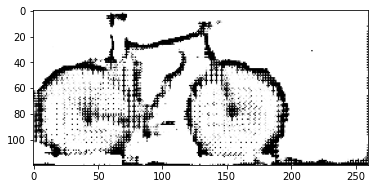


Epoch 160, Gen Loss: 7.831071853637695, Disc Loss: -0.8081866502761841


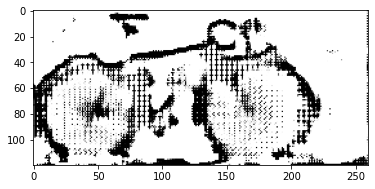


Epoch 161, Gen Loss: 6.94209623336792, Disc Loss: -0.7554483413696289


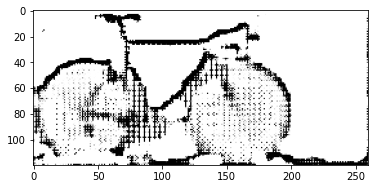


Epoch 162, Gen Loss: 6.612401485443115, Disc Loss: -0.797370195388794


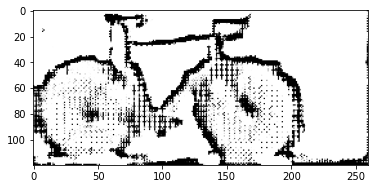


Epoch 163, Gen Loss: 5.613473415374756, Disc Loss: -0.9448654651641846


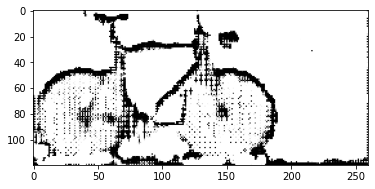


Epoch 164, Gen Loss: 5.961522102355957, Disc Loss: -0.9442744851112366


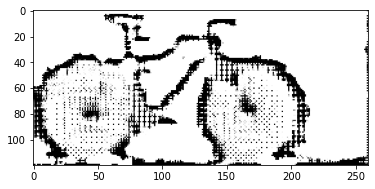


Epoch 165, Gen Loss: 4.784085750579834, Disc Loss: -0.8139089941978455


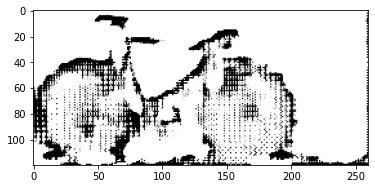


Epoch 166, Gen Loss: 4.541923999786377, Disc Loss: -0.7875930070877075


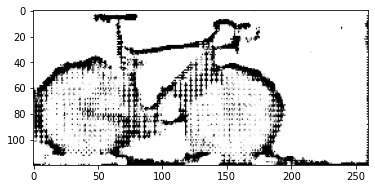


Epoch 167, Gen Loss: 5.300534725189209, Disc Loss: -0.7362695932388306


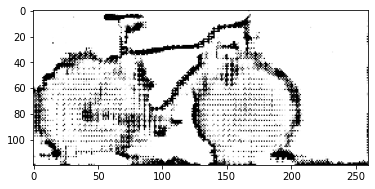


Epoch 168, Gen Loss: 6.407165050506592, Disc Loss: -0.8152108788490295


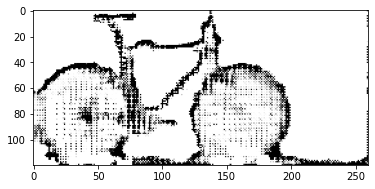


Epoch 169, Gen Loss: 6.091426372528076, Disc Loss: -0.765546441078186


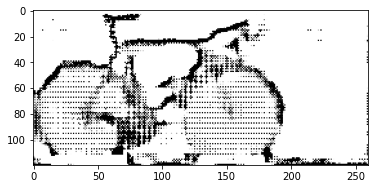


Epoch 170, Gen Loss: 6.0713791847229, Disc Loss: -0.770904541015625


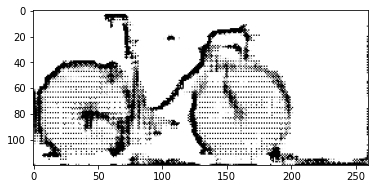


Epoch 171, Gen Loss: 5.026881217956543, Disc Loss: -1.0375066995620728


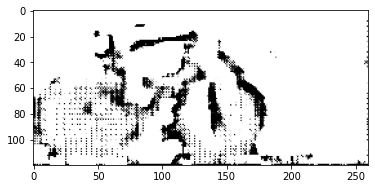


Epoch 172, Gen Loss: 4.122702121734619, Disc Loss: -0.7042365074157715


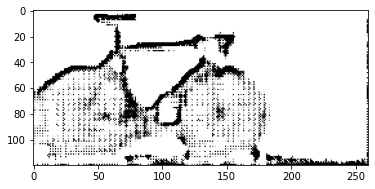


Epoch 173, Gen Loss: 5.593529224395752, Disc Loss: -0.6195111870765686


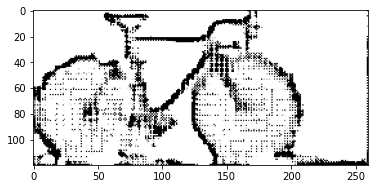


Epoch 174, Gen Loss: 5.254117012023926, Disc Loss: -0.537885308265686


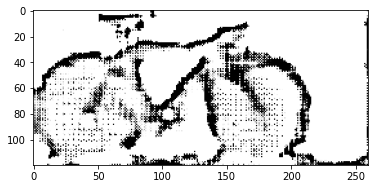


Epoch 175, Gen Loss: 4.180814266204834, Disc Loss: -0.6148831844329834


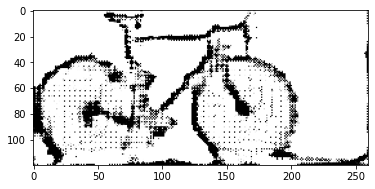


Epoch 176, Gen Loss: 6.177849292755127, Disc Loss: -0.6243418455123901


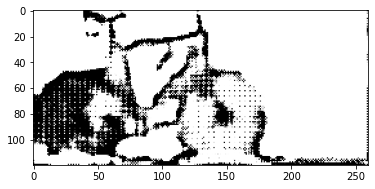


Epoch 177, Gen Loss: 5.655277252197266, Disc Loss: -0.8231720328330994


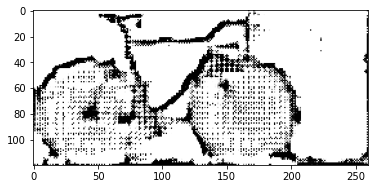


Epoch 178, Gen Loss: 4.878050327301025, Disc Loss: -0.7169519662857056


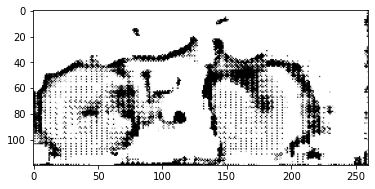


Epoch 179, Gen Loss: 2.969966173171997, Disc Loss: -0.8847215175628662


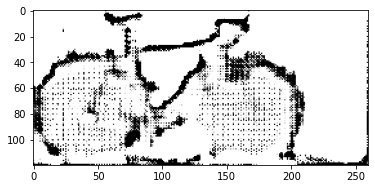


Epoch 180, Gen Loss: 3.8038718700408936, Disc Loss: -0.7169133424758911


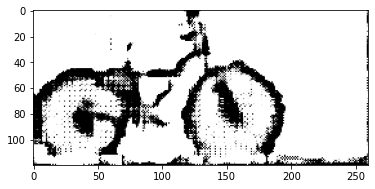


Epoch 181, Gen Loss: 3.732877731323242, Disc Loss: -0.5360127091407776


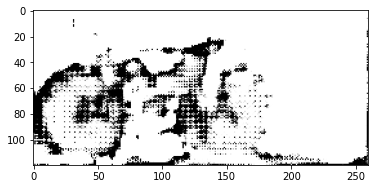


Epoch 182, Gen Loss: 2.818211555480957, Disc Loss: -0.7073887586593628


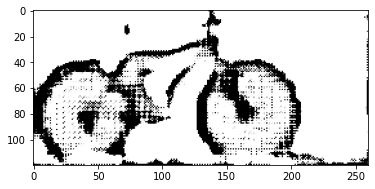


Epoch 183, Gen Loss: 3.041408061981201, Disc Loss: -0.7480518817901611


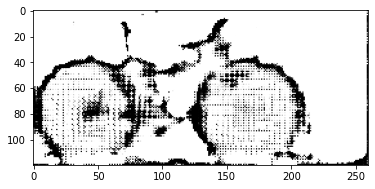


Epoch 184, Gen Loss: 2.504215955734253, Disc Loss: -0.6546005606651306


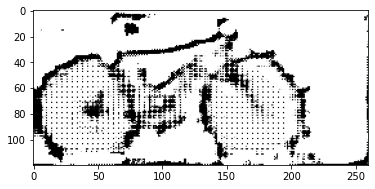


Epoch 185, Gen Loss: 3.6243319511413574, Disc Loss: -0.6781190633773804


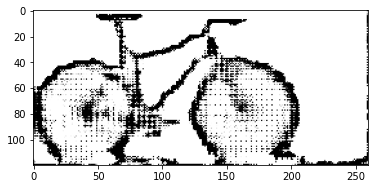


Epoch 186, Gen Loss: 2.463674545288086, Disc Loss: -0.6582968831062317


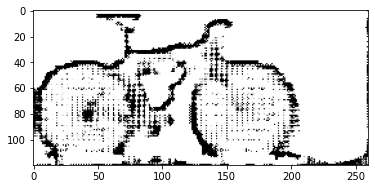


Epoch 187, Gen Loss: 2.8535306453704834, Disc Loss: -0.8359196186065674


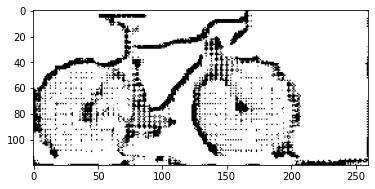


Epoch 188, Gen Loss: 1.9316682815551758, Disc Loss: -0.6544726490974426


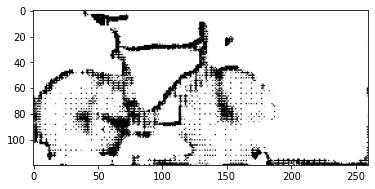


Epoch 189, Gen Loss: -0.37616661190986633, Disc Loss: -0.9721627831459045


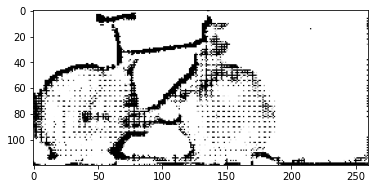


Epoch 190, Gen Loss: -1.335207462310791, Disc Loss: -0.7395661473274231


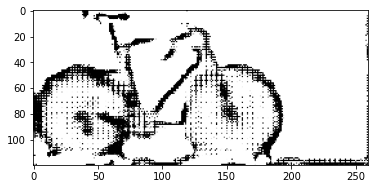


Epoch 191, Gen Loss: -0.7616415619850159, Disc Loss: -0.6088885068893433


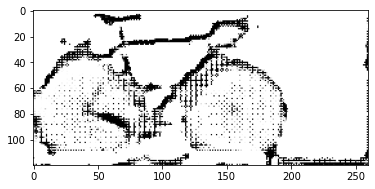


Epoch 192, Gen Loss: -0.5003461241722107, Disc Loss: -0.549778938293457


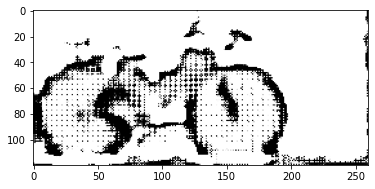


Epoch 193, Gen Loss: 0.7910245060920715, Disc Loss: -0.49693018198013306


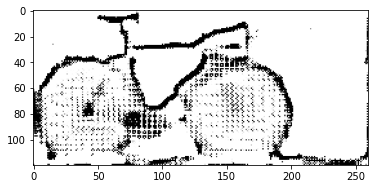


Epoch 194, Gen Loss: 0.9024576544761658, Disc Loss: -0.5206536650657654


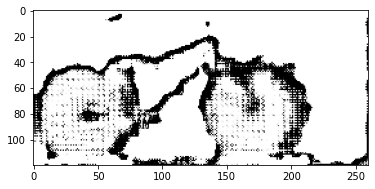


Epoch 195, Gen Loss: -0.16845856606960297, Disc Loss: -0.5949955582618713


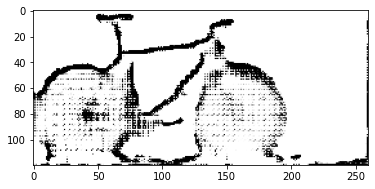


Epoch 196, Gen Loss: -0.31929826736450195, Disc Loss: -0.5393000245094299


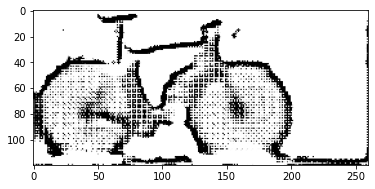


Epoch 197, Gen Loss: 0.4865191876888275, Disc Loss: -0.6988385319709778


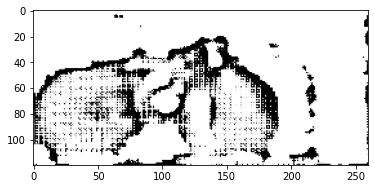


Epoch 198, Gen Loss: -0.6096877455711365, Disc Loss: -0.7435745596885681


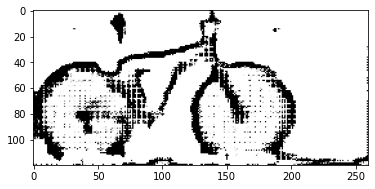


Epoch 199, Gen Loss: 0.11525779217481613, Disc Loss: -0.6216726303100586


In [17]:
noise_dim = 32
num_examples_to_generate = 16
BATCH_SIZE = 32
dim_y=np.shape(image_train[1])
image_train_batched=tf.data.Dataset.from_tensor_slices(image_train).batch(BATCH_SIZE)
image_val_batched=tf.data.Dataset.from_tensor_slices(image_val).batch(BATCH_SIZE)
GAN=imGAN(dim_y, noise_dim)
generator = GAN.generator()
discriminator = GAN.discriminator()
generator.summary()
discriminator.summary()
# d_lr = tf.keras.optimizers.schedules.ExponentialDecay(1e-3, 10*141, 0.8, staircase=True, name=None)
# g_lr = tf.keras.optimizers.schedules.ExponentialDecay(1e-3, 10*141, 0.8, staircase=True, name=None)
# generator_optimizer = tf.keras.optimizers.RMSprop(g_lr)
# discriminator_optimizer = tf.keras.optimizers.RMSprop(d_lr)
generator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)
discriminator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)
checkpoint_dir = './GAN_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer, discriminator_optimizer=discriminator_optimizer,generator=generator,discriminator=discriminator)
traindataGAN(image_train_batched, generator, discriminator, generator_optimizer, discriminator_optimizer, noise_dim)